<a href="https://colab.research.google.com/github/Brymer-Meneses/PyTorch-Basics/blob/master/DCGAN_Faces.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [1]:
!gdown --id 1jj8518f_JNmwP7dpdb2_MSyrq40wTsN4 -O faces.zip

Downloading...
From: https://drive.google.com/uc?id=1jj8518f_JNmwP7dpdb2_MSyrq40wTsN4
To: /content/faces.zip
1.44GB [00:19, 72.2MB/s]


In [ ]:
!unzip /content/faces.zip

# Modules

In [3]:
%matplotlib inline

import os
import torch
import torch.nn as nn

import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [6]:
import shutil

shutil.rmtree('/content/sample_data')
os.remove('/content/faces.zip')

In [7]:
data_root = '/content'

image_size = 64
batch_size = 128

# number of channels in the image
nc = 3 

# size of generator input
nz = 100 

# size of feature maps in generator
ngf = 64

# size of feature maps in discriminator
ndf = 64

# number of training epochs
num_epochs = 5
ngpu =1
lr = 0.0002
beta1 = 0.5
ngpu = 1

In [8]:
img_augmentation = transforms.Compose([
                                       transforms.Resize(image_size),
                                       transforms.CenterCrop(image_size),
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.5]*3, [0.5]*3)
])

dataset = dset.ImageFolder(root=data_root, transform = img_augmentation)
dataloader = torch.utils.data.DataLoader(dataset, batch_size = batch_size,
                                         shuffle = True)
                          
                           
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")           


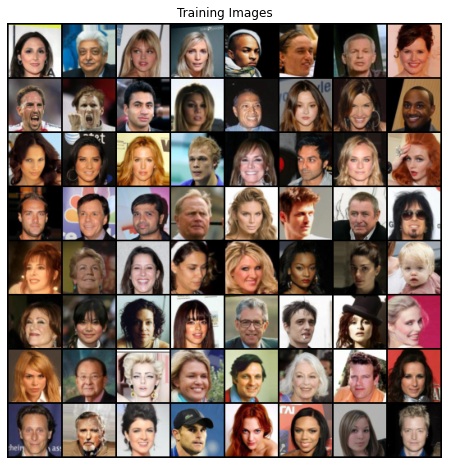

In [9]:
real_batch = next(iter(dataloader))
plt.figure(figsize = (8,8))
plt.axis("off")
plt.title("Training Images")
images = np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], 
                                       padding =2, 
                                       normalize =True).cpu(),(1,2,0))
plt.imshow(images)

In [10]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [11]:
class Generator(nn.Module):
  def __init__(self, ngpu):
    super(Generator, self).__init__()
    self.ngpu = ngpu
    self.main = nn.Sequential(
        nn.ConvTranspose2d(in_channels= nz,
                           out_channels = ngf*8, 
                           kernel_size = 4,
                           stride = 1, 
                           padding = 0, 
                           bias = False),
        nn.BatchNorm2d(ngf*8),
        nn.ReLU(True),
        
        nn.ConvTranspose2d(in_channels= ngf*8,
                           out_channels = ngf*4, 
                           kernel_size = 4,
                           stride = 2, 
                           padding = 1, 
                           bias = False),
        nn.BatchNorm2d(ngf*4),
        nn.ReLU(True),

        nn.ConvTranspose2d(in_channels= ngf*4,
                           out_channels = ngf*2, 
                           kernel_size = 4,
                           stride = 2, 
                           padding = 1, 
                           bias = False),
        nn.BatchNorm2d(ngf*2),
        nn.ReLU(True),

        nn.ConvTranspose2d(in_channels= ngf*2,
                           out_channels = ngf, 
                           kernel_size = 4,
                           stride = 2, 
                           padding = 1, 
                           bias = False),
        nn.BatchNorm2d(ngf),
        nn.ReLU(True),

        nn.ConvTranspose2d(in_channels= ngf,
                           out_channels = nc, 
                           kernel_size = 4,
                           stride = 2, 
                           padding = 1, 
                           bias = False),
        nn.Tanh()
                         
    )
    return

  def forward(self, input):
    return self.main(input)

In [12]:
netG = Generator(ngpu).to(device)
netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [13]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
        return

    def forward(self, input):
        return self.main(input)

In [14]:
netD = Discriminator(ngpu).to(device)
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [15]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1,1,device =device)

real_label = 1
fake_label = 0

optimizerD = optim.Adam(netD.parameters(), lr = lr, betas =(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr = lr, betas =(beta1, 0.999))

In [16]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
print('Running on {}'.format(device))
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
Running on cuda:0
[0/5][0/1583]	Loss_D: 1.8219	Loss_G: 2.8222	D(x): 0.3152	D(G(z)): 0.3426 / 0.0803
[0/5][50/1583]	Loss_D: 0.2850	Loss_G: 9.2209	D(x): 0.9363	D(G(z)): 0.0655 / 0.0002
[0/5][100/1583]	Loss_D: 0.1787	Loss_G: 11.3049	D(x): 0.9661	D(G(z)): 0.0713 / 0.0000
[0/5][150/1583]	Loss_D: 0.3533	Loss_G: 4.8612	D(x): 0.9026	D(G(z)): 0.1519 / 0.0125
[0/5][200/1583]	Loss_D: 0.6529	Loss_G: 7.1345	D(x): 0.9788	D(G(z)): 0.4246 / 0.0017
[0/5][250/1583]	Loss_D: 1.7812	Loss_G: 11.1037	D(x): 0.9383	D(G(z)): 0.7287 / 0.0001
[0/5][300/1583]	Loss_D: 0.6149	Loss_G: 4.5814	D(x): 0.6589	D(G(z)): 0.0355 / 0.0223
[0/5][350/1583]	Loss_D: 0.3707	Loss_G: 3.7418	D(x): 0.8960	D(G(z)): 0.1924 / 0.0406
[0/5][400/1583]	Loss_D: 0.7653	Loss_G: 3.9675	D(x): 0.8792	D(G(z)): 0.3865 / 0.0380
[0/5][450/1583]	Loss_D: 0.5276	Loss_G: 4.1556	D(x): 0.8327	D(G(z)): 0.2245 / 0.0253
[0/5][500/1583]	Loss_D: 0.7544	Loss_G: 3.1277	D(x): 0.6179	D(G(z)): 0.0374 / 0.0720
[0/5][550/1583]	Loss_D: 0.2967	Lo

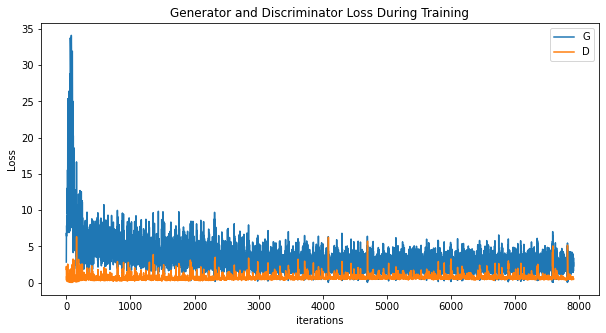

In [17]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

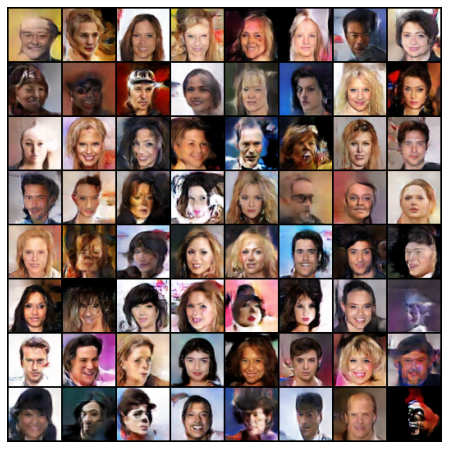

In [18]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())